# DreamBooth LoRA Fine-tuning Assignment

**Total Points: 100** (Plus 10 Bonus Points)

In this assignment, you will implement key components of the **DreamBooth** technique using **LoRA (Low-Rank Adaptation)** to fine-tune a Stable Diffusion model.

## Theoretical Background

### 1. DreamBooth
DreamBooth is a fine-tuning technique designed to teach a text-to-image model about a specific subject (e.g., a specific person, dog, or object) using only a few images (typically 3-5).

**Key Concepts:**
*   **Rare Token Identifier**: We bind the subject to a unique identifier in the prompt, often a rare token sequence like "sks". For example, "a photo of a sks dog". This avoids colliding with the model's existing knowledge of "dog".
*   **Prior Preservation**: A major challenge in fine-tuning on small datasets is *overfitting* and *language drift*. The model might learn your "sks dog" perfectly but forget what a generic "dog" looks like.
    *   **Solution**: We use a **Prior Preservation Loss**. We generate images of the generic class (e.g., "a photo of a dog") using the frozen pre-trained model. These are key "Class Images".
    *   **Loss Function**: The total loss is a weighted sum of the reconstruction loss on your specific instance images and the reconstruction loss on the generated class images. This forces the model to retain its prior knowledge.

### 2. LoRA (Low-Rank Adaptation)
Fine-tuning the entire UNet (billions of parameters) is computationally expensive and storage-heavy. **LoRA** offers a parameter-efficient alternative.

**How it works:**
Instead of updating the full weight matrix $W$, LoRA freezes $W$ and injects trainable rank decomposition matrices.
*   Hypothesis: The change in weights $\Delta W$ during adaptation has a low "intrinsic rank".
*   Decomposition: $\Delta W = B \cdot A$, where $B \in \mathbb{R}^{d 	imes r}$ and $A \in \mathbb{R}^{r 	imes k}$. 
    *   $r$ is the **rank**, a hyperparameter (e.g., 4 or 8), which is much smaller than the model dimension $d$.
*   Forward Pass: $h = W_0 x + \Delta W x = W_0 x + B A x$.
*   **Result**: We only train $A$ and $B$, reducing trainable parameters by up to 10,000x compared to full fine-tuning.

---

## Objectives & Grading
1.  **Part 1: Data Preparation** (5 Points)
    *   Setup custom dataset.
2.  **Part 2: Dataset Class** (35 Points)
    *   Implement data loading and tokenization.
3.  **Part 3: Training Loop** (35 Points)
    *   Implement noise sampling and loss computation.
4.  **Part 4: Inference & Analysis** (25 Points)
    *   Experiment with inference parameters.
5.  **Bonus: Prior Preservation** (10 Points)
    *   Generate class images.



## 1. Setup and Installation

We install `diffusers`, `transformers`, `accelerate`, and `peft` (Parameter-Efficient Fine-Tuning).



In [ ]:
!pip install --upgrade torch torchvision torchaudio fastai

In [ ]:
!pip install -q diffusers transformers accelerate peft bitsandbytes
!pip install -q xformers # Optional: Enable for memory efficiency


In [1]:
import argparse
import copy
import gc
import logging
import math
import os
import shutil
import warnings
from pathlib import Path

import numpy as np
import torch
import torch.nn.functional as F
import torch.utils.checkpoint
import transformers
from accelerate import Accelerator
from accelerate.logging import get_logger
from accelerate.utils import ProjectConfiguration, set_seed
from huggingface_hub.utils import insecure_hashlib
from packaging import version
from peft import LoraConfig
from peft.utils import get_peft_model_state_dict, set_peft_model_state_dict
from PIL import Image
from PIL.ImageOps import exif_transpose
from torch.utils.data import Dataset
from torchvision import transforms
from tqdm.auto import tqdm
from transformers import AutoTokenizer, PretrainedConfig

import diffusers
from diffusers import (
    AutoencoderKL,
    DDPMScheduler,
    DiffusionPipeline,
    DPMSolverMultistepScheduler,
    StableDiffusionPipeline,
    UNet2DConditionModel,
)
from diffusers.loaders import LoraLoaderMixin
from diffusers.optimization import get_scheduler
from diffusers.training_utils import _set_state_dict_into_text_encoder, cast_training_params
from diffusers.utils import (
    check_min_version,
    convert_state_dict_to_diffusers,
    convert_unet_state_dict_to_peft,
    is_wandb_available,
)
from diffusers.utils.import_utils import is_xformers_available
from diffusers.utils.torch_utils import is_compiled_module

logger = get_logger(__name__)


2026-02-16 17:44:53.085086: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1771263893.465666     168 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1771263893.595893     168 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1771263894.553299     168 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1771263894.553332     168 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1771263894.553335     168 computation_placer.cc:177] computation placer alr

## 2. Configuration & Data Preparation (Part 1: 5 Points)

**Instructions:**
1.  **Select a Subject**: Choose a subject (e.g., your pet, a toy, yourself).
2.  **Collect Images**: Take or gather **5 original images** of this subject.
    *   *Requirement*: Images should be **consistent** (same subject). Varying backgrounds is good but keep the subject clearly visible.
3.  **Upload**: Run the cell below to create the folder, then manually upload your images to `./instance_data`.
4.  **Configure**: Update `instance_prompt`, `class_prompt`, and `validation_prompt` in the config below.

**Note on Hyperparameters**:
*   `max_train_steps=1000`: Sufficient for LoRA to learn the subject.
*   `train_text_encoder = True`: We train the text encoder (CLIP) to better learn the prompt association (e.g., "sks cat").



In [2]:
class TrainingConfig:
    pretrained_model_name_or_path = "runwayml/stable-diffusion-v1-5"
    instance_data_dir = "/kaggle/input/datasets/alirezanajafimot/my-husky-dreambooth-data"
    class_data_dir = "./class_data"
    output_dir = "./lora-dreambooth-model"
    
    # STUDENT TODO: Update these prompts for your specific subject
    instance_prompt = "a photo of a sks dog"   # Use a unique token like 'sks'
    class_prompt = "a photo of a dog"          # Generic class prompt
    validation_prompt = "a photo of a sks dog in a bucket" 
    
    seed = 42
    resolution = 512
    center_crop = True
    train_text_encoder = True  # Enable to improve prompt fidelity
    train_batch_size = 1
    sample_batch_size = 4
    num_train_epochs = 10      # Increased for better convergence
    max_train_steps = 1000     
    checkpointing_steps = 250
    gradient_accumulation_steps = 1
    learning_rate = 1e-4
    lr_scheduler = "constant"
    lr_warmup_steps = 0
    use_8bit_adam = True
    mixed_precision = "fp16"
    rank = 4 
    with_prior_preservation = True
    prior_loss_weight = 1.0
    num_class_images = 100
    max_grad_norm = 1.0        # Gradient clipping

    # Validation settings
    num_validation_images = 4
    validation_epochs = 50
    validation_images = None
    
    # Misc
    logging_dir = "logs"
    report_to = "tensorboard"
    allow_tf32 = False
    local_rank = -1
    enable_xformers_memory_efficient_attention = True
    pre_compute_text_embeddings = False 
    tokenizer_max_length = None
    text_encoder_use_attention_mask = False
    class_labels_conditioning = None

args = TrainingConfig()

if torch.cuda.is_available():
    device = "cuda"
else:
    device = "cpu"
    args.mixed_precision = "no"
    print("CUDA not available. Switched mixed_precision to 'no'.")


In [3]:
import os
from pathlib import Path

if not os.path.exists(args.class_data_dir):
    os.makedirs(args.class_data_dir)

# Helper function to display a grid of images
def image_grid(imgs, rows, cols):
    assert len(imgs) == rows*cols
    w, h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    grid_w, grid_h = grid.size
    for i, img in enumerate(imgs):
        grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid


## Bonus: Prior Preservation (10 Points)

**The Problem**: If we only train on "sks dog", the model might forget what other normal dogs look like.
**The Solution**: We enable `with_prior_preservation`. We must provide generated images of generic dogs in `class_data_dir`. The model will calculate loss on these too, ensuring it still knows how to generate generic dogs.

**Bonus Task**: Write or run the code below to generate `num_class_images` (e.g. 100) using the `class_prompt` using the pre-trained model.
*Hint*: Use `StableDiffusionPipeline` to generate images and save them to `args.class_data_dir`.



In [4]:
import os
import torch
from diffusers import StableDiffusionPipeline
from tqdm.auto import tqdm
import hashlib
from PIL import Image

os.makedirs(args.class_data_dir, exist_ok=True)

existing_images = [
    f for f in os.listdir(args.class_data_dir) 
    if f.endswith(('.png', '.jpg', '.jpeg'))
]
num_existing = len(existing_images)
num_to_generate = args.num_class_images - num_existing

print(f"Found {num_existing} existing class images.")

if num_to_generate > 0:
    print(f"Generating {num_to_generate} class images for prior preservation...")
    
    pipeline = StableDiffusionPipeline.from_pretrained(
        args.pretrained_model_name_or_path,
        torch_dtype=torch.float16,
        safety_checker=None 
    )
    pipeline.set_progress_bar_config(disable=True)
    pipeline.to(device)


    with torch.autocast("cuda"):
        for i in tqdm(range(num_to_generate), desc="Generating Class Images"):
            image = pipeline(args.class_prompt, num_inference_steps=30).images[0]

            hash_image = hashlib.sha1(image.tobytes()).hexdigest()
            image_filename = f"{args.class_data_dir}/{i + num_existing}_{hash_image}.jpg"
            
            image.save(image_filename)

    print(f" Successfully generated and saved {num_to_generate} images.")
    

    del pipeline
    torch.cuda.empty_cache()
    print("VRAM cleared for training.")
else:
    print("You already have enough class images. Moving on to training!")


Found 0 existing class images.
Generating 100 class images for prior preservation...


model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

text_encoder/model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

unet/diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

vae/diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

`torch_dtype` is deprecated! Use `dtype` instead!
You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


Generating Class Images:   0%|          | 0/100 [00:00<?, ?it/s]

 Successfully generated and saved 100 images.
VRAM cleared for training.


Loading a random sample of 5 prior preservation images...


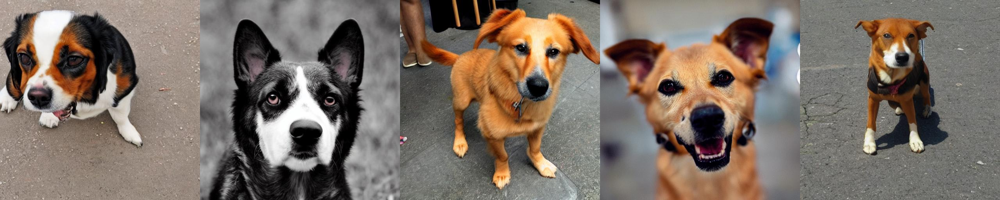

In [5]:
import glob
import random
from PIL import Image
from IPython.display import display

class_image_paths = glob.glob(f"{args.class_data_dir}/*.jpg")

if len(class_image_paths) >= 5:
    print("Loading a random sample of 5 prior preservation images...")
    
    sample_paths = random.sample(class_image_paths, 5)
    
    loaded_class_images = []
    for path in sample_paths:
        img = Image.open(path).convert("RGB")
        img = img.resize((512, 512)) 
        loaded_class_images.append(img)
        
    grid = image_grid(loaded_class_images, rows=1, cols=5)
    display(grid)
    
elif len(class_image_paths) > 0:
    print(f"Found {len(class_image_paths)} images. Not enough for a 1x5 grid, but generation worked.")
else:
    print("Error: No images found in the class directory to display.")

## Part 2: Dataset Class (35 Points)

We need a PyTorch `Dataset` to handle our images.

**Detailed Algorithm**:
1.  **Instance Data**: We read an image $x$, resize/crop it to $512 \times 512$, and normalize it to $[-1, 1]$. We also tokenize the prompt (e.g., "a photo of a sks dog") into `input_ids`.
2.  **Class Data (Prior Preservation)**: If enabled, we also load a random image from the `class_data_dir` and tokenize the class prompt (e.g., "a photo of a dog").
3.  **Return**: The dataset `__getitem__` returns a dictionary containing both instance and (optional) class examples.

**Task**: Complete the `__getitem__` method.



In [6]:
def tokenize_prompt(tokenizer, prompt, tokenizer_max_length=None):
    if tokenizer_max_length is not None:
        max_length = tokenizer_max_length
    else:
        max_length = tokenizer.model_max_length

    text_inputs = tokenizer(
        prompt,
        truncation=True,
        padding="max_length",
        max_length=max_length,
        return_tensors="pt",
    )

    return text_inputs


In [7]:
from PIL import Image
from torch.utils.data import Dataset
from pathlib import Path
from torchvision import transforms

def tokenize_prompt(tokenizer, prompt, tokenizer_max_length=None):
    if tokenizer_max_length is not None:
        max_length = tokenizer_max_length
    else:
        max_length = tokenizer.model_max_length

    text_inputs = tokenizer(
        prompt,
        truncation=True,
        padding="max_length",
        max_length=max_length,
        return_tensors="pt",
    )

    return text_inputs

class DreamBoothDataset(Dataset):
    def __init__(
        self,
        instance_data_root,
        instance_prompt,
        tokenizer,
        class_data_root=None,
        class_prompt=None,
        class_num=None,
        size=512,
        center_crop=False,
        encoder_hidden_states=None,
        class_prompt_encoder_hidden_states=None,
        tokenizer_max_length=None,
    ):
        self.size = size
        self.center_crop = center_crop
        self.tokenizer = tokenizer
        self.encoder_hidden_states = encoder_hidden_states
        self.class_prompt_encoder_hidden_states = class_prompt_encoder_hidden_states
        self.tokenizer_max_length = tokenizer_max_length

        self.instance_data_root = Path(instance_data_root)
        if not self.instance_data_root.exists():
            raise ValueError("Instance images root doesn't exists.")

        self.instance_images_path = list(Path(instance_data_root).iterdir())
        self.num_instance_images = len(self.instance_images_path)
        self.instance_prompt = instance_prompt
        self._length = self.num_instance_images

        if class_data_root is not None:
            self.class_data_root = Path(class_data_root)
            self.class_data_root.mkdir(parents=True, exist_ok=True)
            self.class_images_path = list(self.class_data_root.iterdir())
            if class_num is not None:
                self.num_class_images = min(len(self.class_images_path), class_num)
            else:
                self.num_class_images = len(self.class_images_path)
            self._length = max(self.num_class_images, self.num_instance_images)
            self.class_prompt = class_prompt
        else:
            self.class_data_root = None

        self.image_transforms = transforms.Compose(
            [
                transforms.Resize(size, interpolation=transforms.InterpolationMode.BILINEAR),
                transforms.CenterCrop(size) if center_crop else transforms.RandomCrop(size),
                transforms.ToTensor(),
                transforms.Normalize([0.5], [0.5]),
            ]
        )

    def __len__(self):
        return self._length

    def __getitem__(self, index):
        example = {}
        

        instance_image_path = self.instance_images_path[index % self.num_instance_images]
        instance_image = Image.open(instance_image_path)
        
        if not instance_image.mode == "RGB":
            instance_image = instance_image.convert("RGB")
            
        example["instance_images"] = self.image_transforms(instance_image)
        

        example["instance_prompt_ids"] = tokenize_prompt(
            self.tokenizer,
            self.instance_prompt,
            tokenizer_max_length=self.tokenizer_max_length
        ).input_ids

        if self.class_data_root:
            class_image_path = self.class_images_path[index % self.num_class_images]
            class_image = Image.open(class_image_path)
            
            if not class_image.mode == "RGB":
                class_image = class_image.convert("RGB")
                
            example["class_images"] = self.image_transforms(class_image)
            
            example["class_prompt_ids"] = tokenize_prompt(
                self.tokenizer,
                self.class_prompt,
                tokenizer_max_length=self.tokenizer_max_length
            ).input_ids
            
        return example

In [8]:
def collate_fn(examples, with_prior_preservation=False):
    has_attention_mask = "instance_attention_mask" in examples[0]

    input_ids = [example["instance_prompt_ids"] for example in examples]
    pixel_values = [example["instance_images"] for example in examples]

    if has_attention_mask:
        attention_mask = [example["instance_attention_mask"] for example in examples]

    if with_prior_preservation:
        input_ids += [example["class_prompt_ids"] for example in examples]
        pixel_values += [example["class_images"] for example in examples]
        if has_attention_mask:
            attention_mask += [example["class_attention_mask"] for example in examples]

    pixel_values = torch.stack(pixel_values)
    pixel_values = pixel_values.to(memory_format=torch.contiguous_format).float()

    input_ids = torch.cat(input_ids, dim=0)

    batch = {
        "input_ids": input_ids,
        "pixel_values": pixel_values,
    }

    if has_attention_mask:
        batch["attention_mask"] = attention_mask

    return batch


## 5. Model Loading

We load the `StableDiffusionPipeline` components.

### Understanding Stable Diffusion
Stable Diffusion is a **Latent Diffusion Model (LDM)**. Unlike standard diffusion models that operate in pixel space (which is computationally expensive), LDMs operate in a compressed **latent space**.

**Architecture Components:**
1.  **VAE (Variational Autoencoder)**:
    *   **Encoder**: Compresses the image $x$ into a smaller latent representation $z = \mathcal{E}(x)$ (e.g. $512 \times 512 \rightarrow 64 \times 64$).
    *   **Decoder**: Reconstructs the image from latents $\hat{x} = \mathcal{D}(z)$.
    *   *Role*: Moves the diffusion process from high-dimensional pixels to low-dimensional latents.
2.  **UNet**:
    *   The core "denoising" engine. It takes a noisy latent $z_t$, the timestep $t$, and text embeddings $c$ as input, and predicts the noise $\epsilon$.
    *   *Role*: Learns to reverse the diffusion process.
3.  **Text Encoder (CLIP)**:
    *   Tokenizes and encodes the text prompt into embeddings.
    *   *Role*: Guides the UNet via cross-attention layers.
4.  **Scheduler**:
    *   Controls the noise schedule (how much noise is added at each step) and the sampling algorithm (how to subtract noise during inference).

**Diagram:**

![Stable Diffusion Architecture](sd_architecture.png)

### LoRA Setup
We create a `LoraConfig`. Note the `target_modules` (query, value, key projections in attention layers). We attach these small adapters to the frozen UNet.



In [9]:
def import_model_class_from_model_name_or_path(pretrained_model_name_or_path: str, revision: str):
    text_encoder_config = PretrainedConfig.from_pretrained(
        pretrained_model_name_or_path,
        subfolder="text_encoder",
        revision=revision,
    )
    model_class = text_encoder_config.architectures[0]
    if model_class == "CLIPTextModel":
        from transformers import CLIPTextModel
        return CLIPTextModel
    else:
        raise ValueError(f"{model_class} is not supported.")

def encode_prompt(text_encoder, input_ids, attention_mask, text_encoder_use_attention_mask=None):
    text_input_ids = input_ids.to(text_encoder.device)

    if text_encoder_use_attention_mask:
        attention_mask = attention_mask.to(text_encoder.device)
    else:
        attention_mask = None

    prompt_embeds = text_encoder(
        text_input_ids,
        attention_mask=attention_mask,
        return_dict=False,
    )
    prompt_embeds = prompt_embeds[0]
    return prompt_embeds


## Part 3: Training Loop (35 Points)

**Algorithm Detail**:
Standard Diffusion Training:
1.  **Latents**: Encode image $x$ to latent $z_0 = \mathcal{E}(x)$.
2.  **Noise**: Sample gaussian noise $\epsilon \sim \mathcal{N}(0, I)$ and timestep $t$.
3.  **Forward Diffusion**: Add noise to get $z_t = \sqrt{\bar{\alpha}_t}z_0 + \sqrt{1-\bar{\alpha}_t}\epsilon$.
4.  **Prediction**: The model predicts the noise: $\epsilon_\theta(z_t, t, c)$, where $c$ is the text embedding.
5.  **Loss**: $L = ||\epsilon - \epsilon_\theta(z_t, t, c)||^2$.

**Task**: Implement steps 2, 3, 4, 5 inside the loop.



In [26]:
import os
import torch
import torch.nn.functional as F
from tqdm.auto import tqdm

def training_loop(args, accelerator, unet, text_encoder, vae, noise_scheduler, optimizer, train_dataloader, lr_scheduler):
    
    weight_dtype = torch.float32
    if accelerator.mixed_precision == "fp16":
        weight_dtype = torch.float16
    elif accelerator.mixed_precision == "bf16":
        weight_dtype = torch.bfloat16

    global_step = 0
    
    progress_bar = tqdm(range(args.max_train_steps), disable=not accelerator.is_local_main_process)
    progress_bar.set_description("Steps")

    for epoch in range(args.num_train_epochs):
        unet.train()
        if args.train_text_encoder:
            text_encoder.train()
        
        for step, batch in enumerate(train_dataloader):
            with accelerator.accumulate(unet):
                pixel_values = batch["pixel_values"].to(dtype=weight_dtype)

                with torch.no_grad():
                    if vae is not None:
                        model_input = vae.encode(pixel_values).latent_dist.sample()
                        model_input = model_input * vae.config.scaling_factor
                    else:
                        model_input = pixel_values

                bsz = model_input.shape[0]
                timesteps = torch.randint(
                    0, noise_scheduler.config.num_train_timesteps, (bsz,), device=model_input.device
                )
                timesteps = timesteps.long()

                encoder_hidden_states = encode_prompt(
                    text_encoder,
                    batch["input_ids"],
                    batch.get("attention_mask", None),
                    text_encoder_use_attention_mask=args.text_encoder_use_attention_mask,
                )

                noise = torch.randn_like(model_input)
                
                noisy_model_input = noise_scheduler.add_noise(model_input, noise, timesteps)
                
                noisy_model_input.requires_grad_(True)
                
                model_pred = unet(noisy_model_input, timesteps, encoder_hidden_states).sample
                
                loss = F.mse_loss(model_pred.float(), noise.float(), reduction="mean")
                
                accelerator.backward(loss)
                if accelerator.sync_gradients:
                    accelerator.clip_grad_norm_(unet.parameters(), args.max_grad_norm)
                optimizer.step()
                lr_scheduler.step()
                optimizer.zero_grad()

            if accelerator.sync_gradients:
                progress_bar.update(1)
                global_step += 1
                
                if global_step % args.checkpointing_steps == 0:
                    save_path = os.path.join(args.output_dir, f"checkpoint-{global_step}")
                    accelerator.save_state(save_path)

            if global_step >= args.max_train_steps:
                break

## 7. Execution

Initialize and run. Notice the check for `prior_preservation`: if you didn't provide class images, ensure you handle it or the code might warn/skip.



In [27]:
import gc
import torch

try:
    del unet, text_encoder, vae, optimizer, accelerator, train_dataloader, lr_scheduler
except NameError:
    pass

gc.collect()

torch.cuda.empty_cache()

print("VRAM successfully cleared!")

VRAM successfully cleared!


In [28]:
accelerator = Accelerator(
    gradient_accumulation_steps=args.gradient_accumulation_steps,
    mixed_precision=args.mixed_precision,
    log_with=args.report_to,
    project_config=ProjectConfiguration(project_dir=args.output_dir, logging_dir=Path(args.output_dir, args.logging_dir))
)

tokenizer = AutoTokenizer.from_pretrained(args.pretrained_model_name_or_path, subfolder="tokenizer", use_fast=False)
text_encoder_cls = import_model_class_from_model_name_or_path(args.pretrained_model_name_or_path, None)
noise_scheduler = DDPMScheduler.from_pretrained(args.pretrained_model_name_or_path, subfolder="scheduler")
text_encoder = text_encoder_cls.from_pretrained(args.pretrained_model_name_or_path, subfolder="text_encoder")
vae = AutoencoderKL.from_pretrained(args.pretrained_model_name_or_path, subfolder="vae")
unet = UNet2DConditionModel.from_pretrained(args.pretrained_model_name_or_path, subfolder="unet")

vae.requires_grad_(False)
text_encoder.requires_grad_(False)
unet.requires_grad_(False)


unet.enable_gradient_checkpointing()
if args.train_text_encoder:
    text_encoder.gradient_checkpointing_enable()
    text_encoder.enable_input_require_grads() 

unet_lora_config = LoraConfig(
    r=args.rank,
    lora_alpha=args.rank,
    init_lora_weights="gaussian",
    target_modules=["to_k", "to_q", "to_v", "to_out.0", "add_k_proj", "add_v_proj"],
)
unet.add_adapter(unet_lora_config)


if args.train_text_encoder:
    text_lora_config = LoraConfig(
        r=args.rank,
        lora_alpha=args.rank,
        init_lora_weights="gaussian",
        target_modules=["q_proj", "k_proj", "v_proj", "out_proj"], 
    )
    text_encoder.add_adapter(text_lora_config)

if args.use_8bit_adam:
    import bitsandbytes as bnb
    optimizer_class = bnb.optim.AdamW8bit
else:
    optimizer_class = torch.optim.AdamW

params_to_optimize = list(filter(lambda p: p.requires_grad, unet.parameters()))
if args.train_text_encoder:
    params_to_optimize += list(filter(lambda p: p.requires_grad, text_encoder.parameters()))

optimizer = optimizer_class(params_to_optimize, lr=args.learning_rate, weight_decay=1e-2)

unet, text_encoder, optimizer = accelerator.prepare(unet, text_encoder, optimizer)
weight_dtype = torch.float32
if accelerator.mixed_precision == "fp16":
    weight_dtype = torch.float16
elif accelerator.mixed_precision == "bf16":
    weight_dtype = torch.bfloat16
    
vae.to(accelerator.device, dtype=weight_dtype)
if not args.train_text_encoder:
    text_encoder.to(accelerator.device, dtype=weight_dtype)

if args.with_prior_preservation:
    if not os.path.exists(args.class_data_dir) or len(list(Path(args.class_data_dir).glob("*"))) == 0:
        print("Warning: Class data directory missing or empty. Disabling prior preservation.")
        args.with_prior_preservation = False

train_dataset = DreamBoothDataset(
    instance_data_root=args.instance_data_dir,
    instance_prompt=args.instance_prompt,
    class_data_root=args.class_data_dir if args.with_prior_preservation else None,
    class_prompt=args.class_prompt,
    class_num=args.num_class_images,
    tokenizer=tokenizer,
    size=args.resolution,
    center_crop=args.center_crop,
)

train_dataloader = torch.utils.data.DataLoader(
    train_dataset,
    batch_size=args.train_batch_size,
    shuffle=True,
    collate_fn=lambda examples: collate_fn(examples, args.with_prior_preservation),
    num_workers=1,
)

lr_scheduler = get_scheduler(
    args.lr_scheduler,
    optimizer=optimizer,
    num_warmup_steps=args.lr_warmup_steps,
    num_training_steps=args.max_train_steps,
)

train_dataloader, lr_scheduler = accelerator.prepare(train_dataloader, lr_scheduler)

print("Starting training...")
training_loop(args, accelerator, unet, text_encoder, vae, noise_scheduler, optimizer, train_dataloader, lr_scheduler)
print("Training finished!")


if accelerator.is_main_process:
    unet = unet.to(torch.float32)
    unet_lora_state_dict = convert_state_dict_to_diffusers(get_peft_model_state_dict(unet))
    
    text_encoder_lora_state_dict = None
    if args.train_text_encoder:
        text_encoder = text_encoder.to(torch.float32)
        text_encoder_lora_state_dict = convert_state_dict_to_diffusers(get_peft_model_state_dict(text_encoder))

    LoraLoaderMixin.save_lora_weights(
        save_directory=args.output_dir,
        unet_lora_layers=unet_lora_state_dict,
        text_encoder_lora_layers=text_encoder_lora_state_dict,
    )
    print(f"Model and Text Encoder safely saved to {args.output_dir}")

You are using a model of type clip_text_model to instantiate a model of type . This is not supported for all configurations of models and can yield errors.


Starting training...


  0%|          | 0/1000 [00:00<?, ?it/s]

Training finished!
Model and Text Encoder safely saved to ./lora-dreambooth-model


## Part 4: Inference & Analysis (25 Points)

**Instructions**:
1.  Run the inference code.
2.  **Generate 5 distinct samples** by varying parameters.
    *   **Guidance Scale**: Try 5.0 (softer), 7.5 (standard), 10.0 (sharper). High guidance forces the model to follow closely but can ruin quality.
    *   **Inference Steps**: Try 30, 50, 100.
3.  Display these 5 images and specifically mention the prompt and parameters used for each.



Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Starting complete inference matrix...

Sample Set 1: Base Husky Concept
Prompt: 'a photo of a sks dog in a bucket' | CFG Scale: 7.5


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Displaying: 30 Steps | 50 Steps | 100 Steps


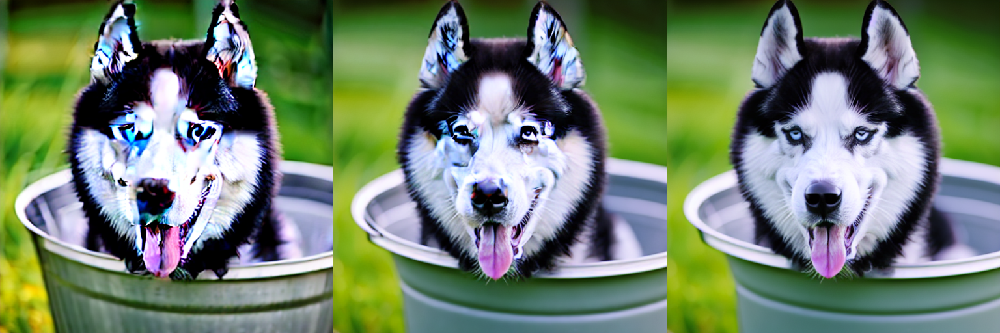



Sample Set 2: Low Guidance (Testing model freedom)
Prompt: 'a photo of a sks dog in a bucket' | CFG Scale: 5.0


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Displaying: 30 Steps | 50 Steps | 100 Steps


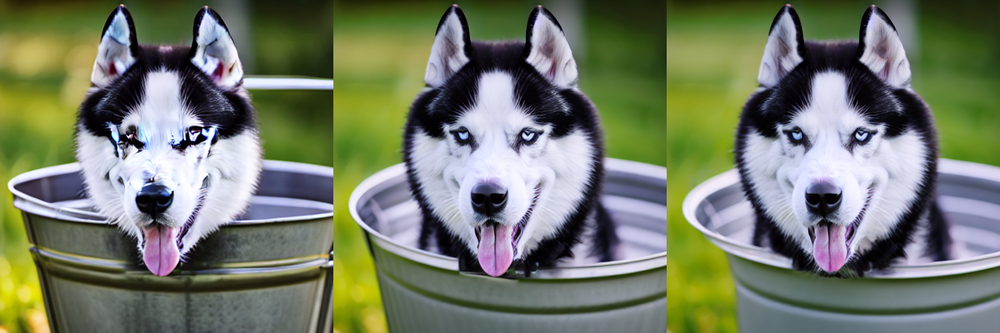



Sample Set 3: High Guidance (Testing prompt adherence)
Prompt: 'a photo of a sks dog in a bucket' | CFG Scale: 10.0


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Displaying: 30 Steps | 50 Steps | 100 Steps


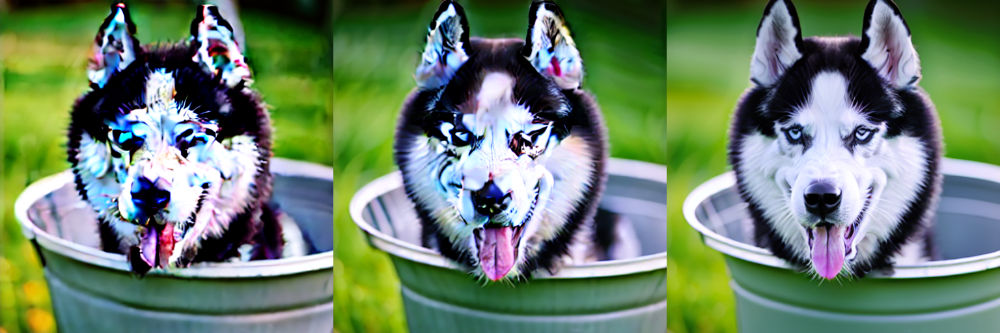



Sample Set 4: Prompt Decorator 1: Cinematic & Dynamic
Prompt: 'a photo of a sks dog running through a snowy forest, majestic cinematic lighting, 8k resolution' | CFG Scale: 7.5


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Displaying: 30 Steps | 50 Steps | 100 Steps


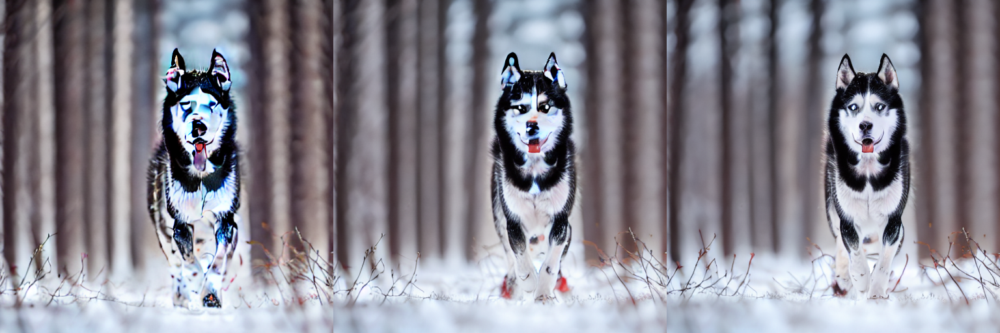



Sample Set 5: Prompt Decorator 2: Stylized Subject
Prompt: 'a portrait of a sks dog on a sunny beach' | CFG Scale: 7.5


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Displaying: 30 Steps | 50 Steps | 100 Steps


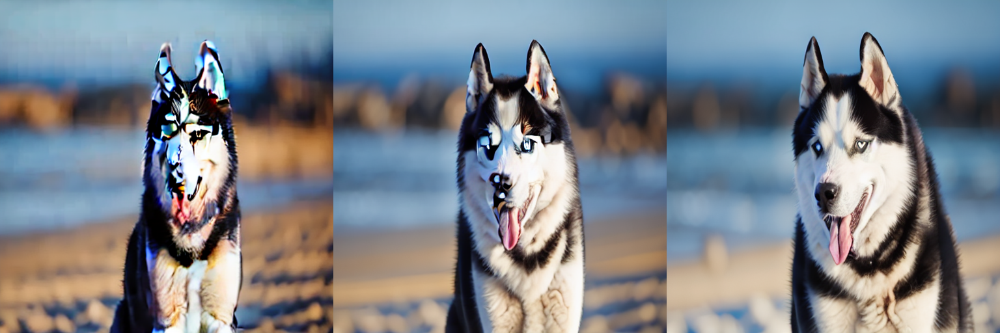



Sample Set 6: Normal Dog Check (No 'sks' token)
Prompt: 'a high quality photo of a golden retriever playing in a park' | CFG Scale: 7.5


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Displaying: 30 Steps | 50 Steps | 100 Steps


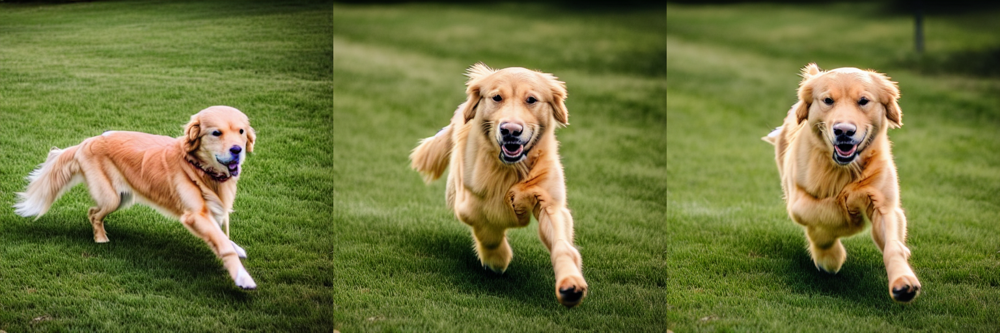

In [33]:
from diffusers import StableDiffusionPipeline
import torch
from IPython.display import display
from PIL import Image

model_path = "runwayml/stable-diffusion-v1-5"
lora_path = args.output_dir

pipe = StableDiffusionPipeline.from_pretrained(model_path, torch_dtype=torch.float16)
pipe.to("cuda")
pipe.load_lora_weights(lora_path)

def image_grid(imgs, rows, cols):
    assert len(imgs) == rows*cols
    w, h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    for i, img in enumerate(imgs):
        grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

generator = torch.Generator(device="cuda")

step_counts = [30, 50, 100]

experiments = [
    {
        "description": "Base Husky Concept",
        "prompt": "a photo of a sks dog in a bucket",
        "guidance_scale": 7.5,
    },
    {
        "description": "Low Guidance (Testing model freedom)",
        "prompt": "a photo of a sks dog in a bucket",
        "guidance_scale": 5.0,
    },
    {
        "description": "High Guidance (Testing prompt adherence)",
        "prompt": "a photo of a sks dog in a bucket",
        "guidance_scale": 10.0,
    },
    {
        "description": "Prompt Decorator 1: Cinematic & Dynamic",
        "prompt": "a photo of a sks dog running through a snowy forest, majestic cinematic lighting, 8k resolution",
        "guidance_scale": 7.5,
    },
    {
        "description": "Prompt Decorator 2: Stylized Subject",
        "prompt": "a portrait of a sks dog on a sunny beach",
        "guidance_scale": 7.5,
    },
    {
        "description": "Normal Dog Check (No 'sks' token)",
        "prompt": "a high quality photo of a golden retriever playing in a park",
        "guidance_scale": 7.5,
    }
]

print("Starting complete inference matrix...\n")

for i, exp in enumerate(experiments):
    print("=" * 70)
    print(f"Sample Set {i+1}: {exp['description']}")
    print(f"Prompt: '{exp['prompt']}' | CFG Scale: {exp['guidance_scale']}")
    
    generated_images = []
    
    for steps in step_counts:

        generator.manual_seed(42)
        
        image = pipe(
            exp["prompt"],
            num_inference_steps=steps,
            guidance_scale=exp["guidance_scale"],
            generator=generator
        ).images[0]
        
        generated_images.append(image)
        
    print(f"Displaying: 30 Steps | 50 Steps | 100 Steps")
    grid = image_grid(generated_images, rows=1, cols=3)
    display(grid)
    grid.save(f"experiment_{i+1}_grid.png")
    print("\n")